# Audio (1D) a Espectrogramas (2D) para CNN

In [2]:
import os

import torch
import torchaudio
import torchaudio.transforms as T

import ipywidgets as widgets
from ipywidgets import interact
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Configuramos el tamaño y resolución estándar para nuestras gráficas de matplotlib
plt.rcParams['figure.figsize'] = [20, 4]
plt.rcParams['figure.dpi'] = 300

## Carga y Visualización 1D

Todo sonido digital es una secuencia larguísima de números (amplitudes) registrados a través del tiempo.

Al cargarlo en `torchaudio`, obtenemos dos cosas:
1. **Waveform (Forma de Onda):** El Tensor de amplitudes en formato `[canales, tiempo]`.
2. **Sample Rate (Frecuencia de Muestreo):** Cuántas muestras se tomaron por segundo (ej. 44100 Hz = 44100 valores por segundo).

Forma del Tensor de Audio (Waveform): torch.Size([1, 300116])
Frecuencia de muestreo (Sample Rate): 22050 Hz


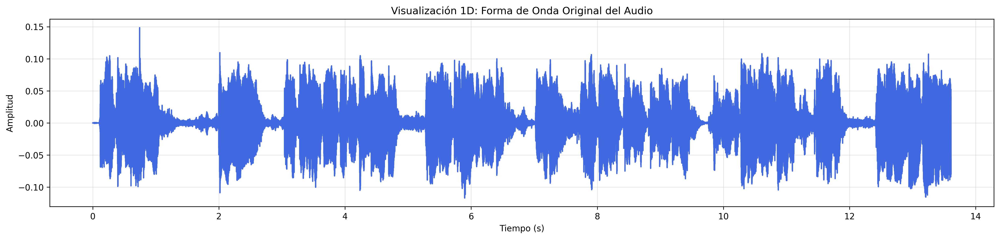

In [3]:
# 1. Identificamos el archivo de audio
filename = "vete-de-mi-cuarto.wav"

# 2. Cargar el audio usando la abstracción de PyTorch
waveform, sample_rate = torchaudio.load(filename)

print(f"Forma del Tensor de Audio (Waveform): {waveform.shape}")
print(f"Frecuencia de muestreo (Sample Rate): {sample_rate} Hz")

# 3. Reproducimos el clip para escuchar qué estamos analizando
display(Audio(waveform.numpy()[0], rate=sample_rate))

# 4. Graficar la onda acústica contra el tiempo (1D)
tiempo = torch.arange(waveform.shape[1]) / sample_rate  # Convertir muestras a segundos

plt.plot(tiempo, waveform[0].numpy(), color='royalblue')
plt.title("Visualización 1D: Forma de Onda Original del Audio")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid(True, alpha=0.3)
plt.show()

In [8]:
max_time = waveform.shape[1] / sample_rate # Calculate total duration of the audio

@interact(
    start_time=widgets.FloatSlider(min=0.0, max=max_time - 0.1, step=0.1, value=0.0, description='START (s):'),
    end_time=widgets.FloatSlider(min=0.1, max=max_time, step=0.1, value=max_time, description='END (s):')
)
def interact_audio_crop(start_time, end_time):
    if start_time >= end_time:
        print("Error: START time must be less than END time.")
        return

    # Convert seconds to sample indices
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)

    # Crop the waveform
    cropped_waveform = waveform[:, start_sample:end_sample]
    cropped_tiempo = torch.arange(cropped_waveform.shape[1]) / sample_rate + start_time

    print(f"Audio original duration: {max_time:.2f} s")
    print(f"Cropped audio duration: {(end_time - start_time):.2f} s")
    print(f"Cropped waveform shape: {cropped_waveform.shape}")

    # Play the cropped audio
    print("Playing cropped audio:")
    display(Audio(cropped_waveform.numpy()[0], rate=sample_rate))

    # Plot the cropped waveform
    plt.figure(figsize=(20, 4), dpi=300)
    plt.plot(cropped_tiempo, cropped_waveform[0].numpy(), color='#4f89db')
    plt.title(f"Cropped Waveform (START: {start_time:.2f}s, END: {end_time:.2f}s)")
    plt.xlabel("Tiempo (s)")
    plt.ylabel("Amplitud")
    plt.grid(True, alpha=0.3)
    plt.show()


interactive(children=(FloatSlider(value=0.0, description='START (s):', max=13.510702947845806), FloatSlider(va…

## Sección 2: STFT

Divide todo el audio en "ventanas" cortas de tiempo, y calcula las frecuencias presentes en cada ventana.

El nivel de detalle visual está dominado por dos parámetros:
- `n_fft` (Tamaño de la Ventana Fourier): Dicta la cantidad de información temporal que se procesa a la vez. Al aumentarlo (ej: 2048), la resolución de frecuencia mejora (se ven líneas horizontales muy finas) pero la resolución de tiempo se vuelve borrosa.
- `hop_length`: Es el "salto" que da la ventana. Afecta directamente cuántos pixeles de *ancho* tendrá la imagen resultante.

In [13]:
from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable

display(Audio(waveform.numpy()[0], rate=sample_rate))

@interact(
    n_fft=widgets.Dropdown(options=[256, 512, 1024, 2048], value=1024, description='n_fft:'),
    hop_length=widgets.IntSlider(min=64, max=1024, step=64, value=512, description='hop_length:')
)
def interact_spectrogram_biplot(n_fft, hop_length):
    # 1. Preparar la transformación del espectrograma
    spec_transform = T.Spectrogram(n_fft=n_fft, hop_length=hop_length, power=2.0)
    spectrogram = spec_transform(waveform)
    spectrogram_plot = torch.log(spectrogram + 1e-9)

    # 2. Configurar GridSpec para control total de alineación
    fig = plt.figure(figsize=(20, 8))
    gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2])

    ax_wave = fig.add_subplot(gs[0, 0])
    ax_spec = fig.add_subplot(gs[1, 0], sharex=ax_wave)

    # --- SUBPLOT 1: Waveform ---
    tiempo = torch.arange(waveform.shape[1]) / sample_rate
    ax_wave.plot(tiempo, waveform[0].numpy(), color='royalblue', linewidth=0.5)
    ax_wave.set_title("Visualización Sincronizada: Waveform vs STFT (GridSpec Alignment)")
    ax_wave.set_ylabel("Amplitud")
    ax_wave.grid(True, alpha=0.3)

    # --- SUBPLOT 2: Espectrograma ---
    img = ax_spec.imshow(
        spectrogram_plot[0].numpy(),
        origin='lower',
        aspect='auto',
        cmap='Blues',
        extent=[0, tiempo[-1], 0, n_fft // 2]
    )
    ax_spec.set_xlabel("Tiempo (s)")
    ax_spec.set_ylabel("Bins de Frecuencia")

    # Alineación de la colorbar usando el divisor para no afectar el ancho del subplot
    divider = make_axes_locatable(ax_spec)
    cax = divider.append_axes("right", size="2%", pad=0.1)
    plt.colorbar(img, cax=cax, label="Log Power")

    # Forzar que la Waveform también tenga un divisor invisible para que los anchos coincidan exactamente
    divider_wave = make_axes_locatable(ax_wave)
    divider_wave.append_axes("right", size="2%", pad=0.1).axis('off')

    plt.tight_layout()
    plt.show()

interactive(children=(Dropdown(description='n_fft:', index=2, options=(256, 512, 1024, 2048), value=1024), Int…

## Sección 3: Mel Spectrogram

El espectrograma anterior reparte las diferentes frecuencias de manera lineal. Sin embargo, el oído humano no los percibe así, sino "logarítmicamente". Si subimos un tono de 100Hz a 200Hz, notamos una subida abrupta. Pero si subimos de 10,000Hz a 10,100Hz apenas y notamos diferencia.

El **Espectrograma de Mel** agrupa la parte superior del espectro y concentra la resolución en las bajas frecuencias. De hecho, podría verse como una **Reducción de Dimensionalidad**. Si configuramos `n_mels = 64`, estamos compactando de quizás cientos de frecuencias a usar únicamente 64 renglones ("Filtros Mel"). Esto ayuda a la CNN a enfocarse en lo (humanamente) importante y a procesar más rápido (cuchao).

In [15]:
from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable

display(Audio(waveform.numpy()[0], rate=sample_rate))

@interact(
    n_mels=widgets.IntSlider(min=10, max=128, step=10, value=64, description='n_mels (Filtros):'),
    n_fft=widgets.Dropdown(options=[256, 512, 1024, 2048], value=1024, description='n_fft (STFT):')
)
def interact_full_spectrogram_alignment(n_mels, n_fft):
    hop_length = 512

    # 1. Procesar transformaciones
    # STFT
    spec_transform = T.Spectrogram(n_fft=n_fft, hop_length=hop_length, power=2.0)
    stft_spec = torch.log(spec_transform(waveform) + 1e-9)

    # Mel Spectrogram
    mel_transform = T.MelSpectrogram(sample_rate=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_spec = torch.log(mel_transform(waveform) + 1e-9)

    # 2. Configurar GridSpec (3 filas)
    fig = plt.figure(figsize=(20, 8))
    gs = gridspec.GridSpec(3, 1, height_ratios=[1, 2, 2])

    ax_wave = fig.add_subplot(gs[0, 0])
    ax_stft = fig.add_subplot(gs[1, 0], sharex=ax_wave)
    ax_mel = fig.add_subplot(gs[2, 0], sharex=ax_wave)

    tiempo = torch.arange(waveform.shape[1]) / sample_rate
    duration = tiempo[-1].item()

    # --- SUBPLOT 1: Waveform ---
    ax_wave.plot(tiempo, waveform[0].numpy(), color='royalblue', linewidth=0.5)
    ax_wave.set_title("Comparativa: Waveform vs STFT vs Mel Spectrogram")
    ax_wave.set_ylabel("Amplitud")
    ax_wave.grid(True, alpha=0.3)

    # --- SUBPLOT 2: STFT ---
    img_stft = ax_stft.imshow(stft_spec[0].numpy(), origin='lower', aspect='auto', cmap='Blues', extent=[0, duration, 0, n_fft // 2])
    ax_stft.set_ylabel("STFT Bins")

    # --- SUBPLOT 3: Mel Spectrogram ---
    img_mel = ax_mel.imshow(mel_spec[0].numpy(), origin='lower', aspect='auto', cmap='Blues', extent=[0, duration, 0, n_mels])
    ax_mel.set_xlabel("Tiempo (s)")
    ax_mel.set_ylabel(f"Mel ({n_mels} filtros)")

    # Alineación de Colorbars con divisores para mantener el ancho del eje X
    for ax, img in zip([ax_stft, ax_mel], [img_stft, img_mel]):
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="2%", pad=0.1)
        plt.colorbar(img, cax=cax)

    # Divisor invisible para la waveform
    divider_wave = make_axes_locatable(ax_wave)
    divider_wave.append_axes("right", size="2%", pad=0.1).axis('off')

    plt.tight_layout()
    plt.show()

interactive(children=(IntSlider(value=64, description='n_mels (Filtros):', max=128, min=10, step=10), Dropdown…